In [1]:
import sys
import warnings
import ee
from tqdm import tqdm
warnings.filterwarnings('ignore')

In [2]:
!earthengine authenticate

Fetching credentials using gcloud
Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=517222506229-vsmmajv00ul0bs7p89v5m89qs8eb9359.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8085%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fearthengine+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdevstorage.full_control+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Faccounts.reauth&state=tlyryce90SZp0W6ZEhqonkV7KNLyLN&access_type=offline&code_challenge=mxnuAYlmXS2DbWZFJ_z4WcdhnAYXu6YR2bgGPLv9PjQ&code_challenge_method=S256


Credentials saved to file: [/Users/victor/.config/gcloud/application_default_credentials.json]

These credentials will be used by any library that requests Application Default Credentials (ADC).


Updates are available for some Google Cloud CLI components.  To install them,
please run:
  $ gcloud components update



To take a quick anonymous survey, run:
  $ gcloud survey


Successfully saved author



# Loading packages



In [6]:
# import local modules
sys.path.append('../src')
from Fishnet import Fishnet
from ImageExporter import ImageExporter
from ImageCorrector import ImageCorrector
from ImageProcessor import ImageProcessor

# update files automatically
%load_ext autoreload
%autoreload 2

# Authenticate to Earth Engine
ee.Initialize(project="jpmorgancapstone")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Fishnet

First, we can generate the fishnet using the following code. 

- We instantiate a `Fishnet` object 
- We generate the fishnet
- We aggregated the fishnet into batches corresponding to the images to extract froom the GoogleEarth Engine

In [12]:
# Generate a fishnet using a shapefile
fishnet_creator_example = Fishnet(
    tile_size_miles=16,
    coordinates=None,
    shapefile_path="../Gis/Texas_State_Boundary/State.shp",
    clip=False,
    overlay_method=None,
)

fishnet_creator_example.create_fishnet()

Using Shapefile to initialize fishnet.


100%|██████████| 47/47 [00:00<00:00, 1876.49it/s]

Generating polygons...
Success. Fishnet created.

 Fishnet Object has the following attributes: 

+----------------+---------------------+-------------------+
|     Metric     |       Degrees       |       Miles       |
+----------------+---------------------+-------------------+
| Fishnet Width  |  13.138423211000031 | 817.0318617424371 |
| Fishnet Height |  10.663161770999977 |  736.75306466581  |
|  Tiles Width   | 0.25728974024319484 |         16        |
|  Tiles Height  | 0.23157027732307967 |         16        |
+----------------+---------------------+-------------------+


In [13]:
fishnet_creator_example.batch(64)

Batching fishnet... 

Success. Fishnet batched.

Fishnet Batch has the following attributes: 

Number of tiles per batch:  4
+---------+-------+---------+
|  Metric | Tiles | Batches |
+---------+-------+---------+
|   Rows  |   47  |    12   |
| Columns |   52  |    13   |
|  Cells  |  2444 |   156   |
+---------+-------+---------+
+--------------+--------------------+-------+
|    Metric    |      Degrees       | Miles |
+--------------+--------------------+-------+
| Batch Width  | 1.0291589609727794 |   64  |
| Batch Height | 0.9262811092923187 |   64  |
+--------------+--------------------+-------+


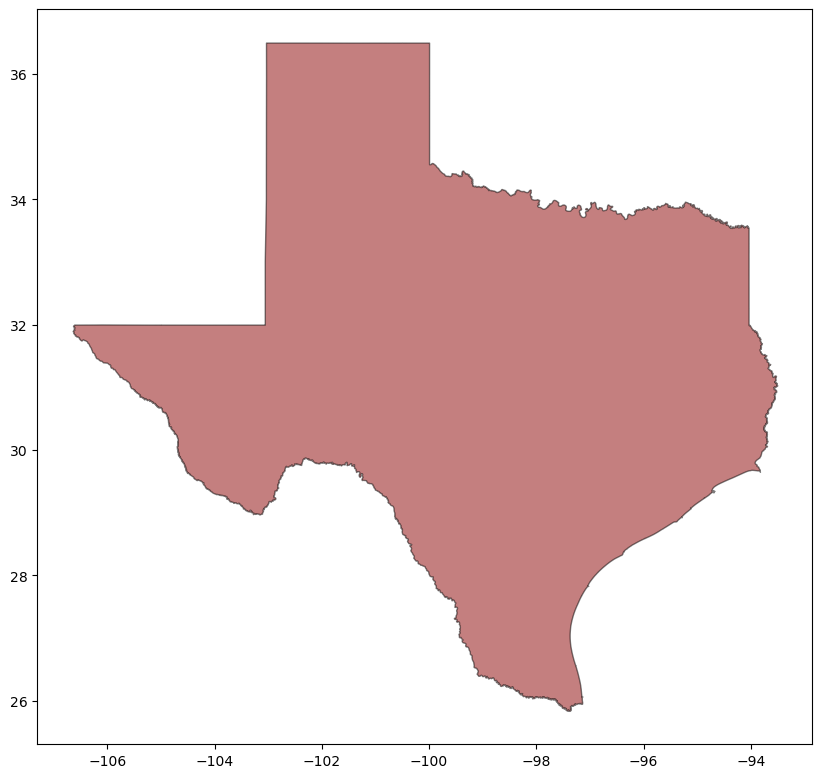

In [34]:
fishnet_creator_example.plot_fishnet()

# Verification
This cell checks whether each tile is fully included within one batch.

In [10]:
res = []
from tqdm import tqdm

# Check if each geometry of "fishnet.fishnet" is contained in the corresponding "fishnet.batches"
for i in tqdm(range(len(fishnet_creator_example.fishnet))):
    row = fishnet_creator_example.fishnet.iloc[i]
    batch_id = row['batch_id']
    
    if not fishnet_creator_example.batches.geometry[batch_id].contains(fishnet_creator_example.fishnet.geometry[i].centroid):
        raise Exception("Batch {} does not contain fishnet tile {}".format(batch_id, i))

100%|██████████| 9637012/9637012 [05:48<00:00, 27632.99it/s]


This function below allows to check whether each fishnet tile is fully included within each batch.

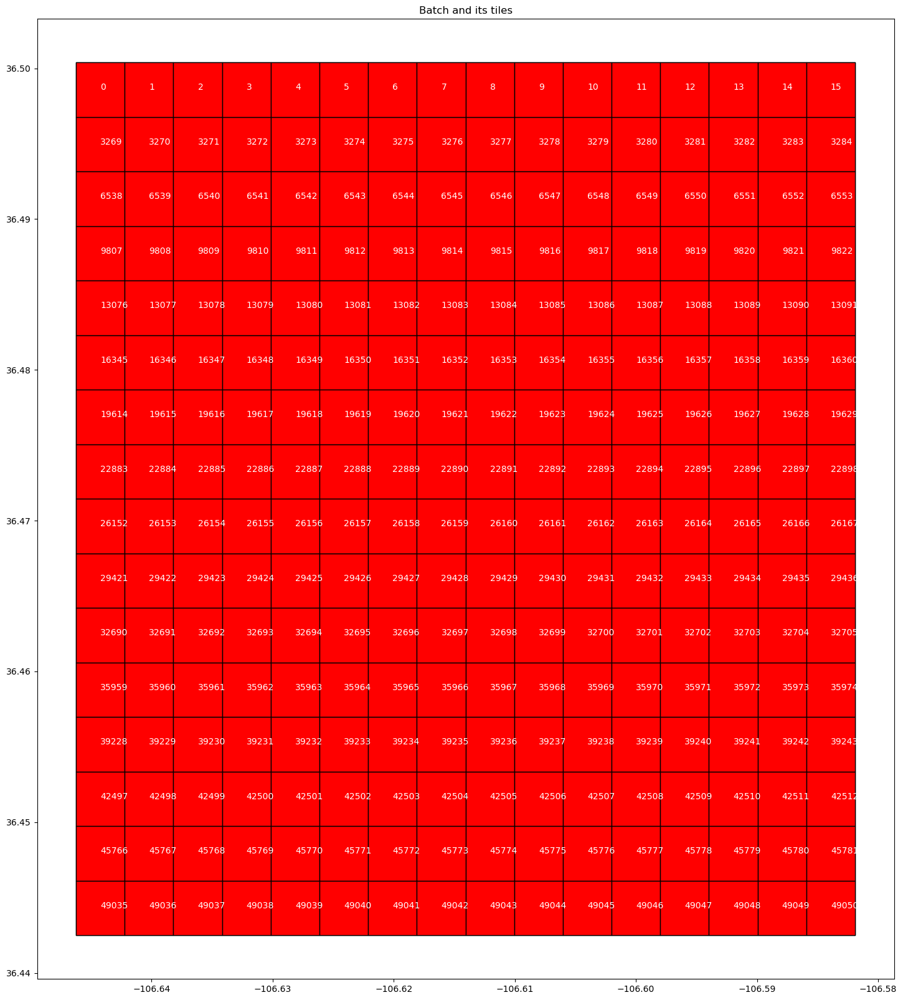

In [22]:
fishnet_creator_example.plot_batch_tiles(batch_id=0)

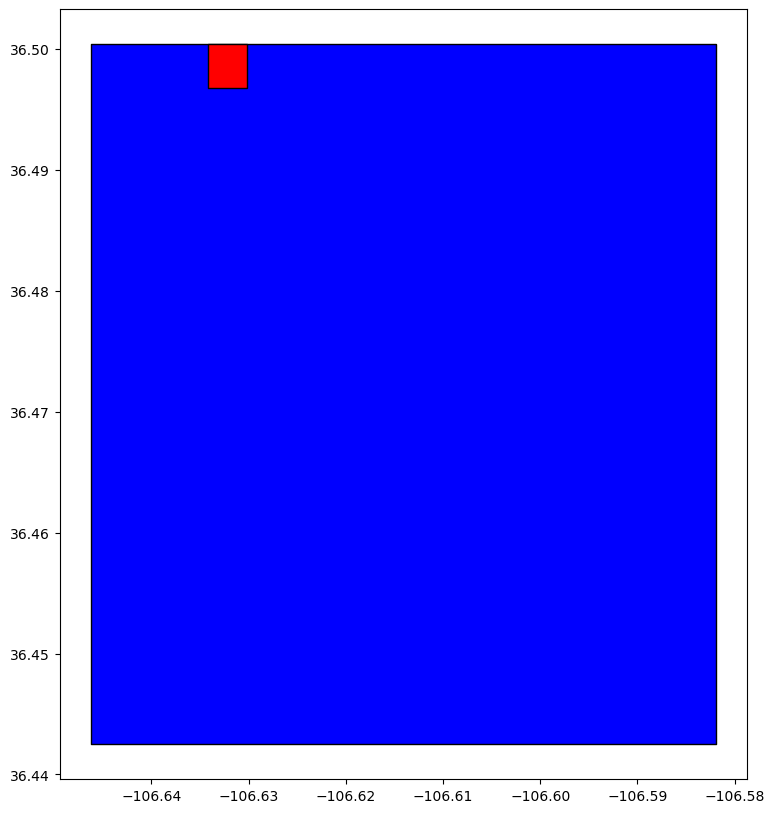

In [23]:
fishnet_creator_example.plot_batch_tile(batch_id=0, tile_id=3)

In [24]:
fishnet_creator_example.plot_fishnet()

Can't plot filtered fishnet for more than 10,000 tiles. Please try with a smaller fishnet.


## Filter the fishnet

We can filter the `Fishnet` to one specific region to avoid working on the whole area, simply to increase computational speed.

In [25]:
region = [-95.799944,29.374853,-95.028636,29.795492]

# Filter the fishnet by the larger bounding box
fishnet_creator_example.filter_fishnet_by_bbox(region)

In [26]:
fishnet_creator_example.plot_filtered_fishnet()

Can't plot filtered fishnet for more than 10,000 tiles. Please try with a smaller fishnet.


## Compute neighbors of each tile

In [27]:
fishnet_creator_example.compute_neighbors()

Computing neighbors...: 3269it [00:37, 86.17it/s]                           


All neighbors computed successfully.


In [28]:
fishnet_creator_example.plot_neighbor(1)

## Save and load the fishnet object

In [29]:
# this specific fishnet was 0.25miles granular and 4miles edge of each batch.
fishnet_creator_example.save('../Gis/Fishnet/fishnet_quarter_mile.pkl') 

# load the object
fishnet_creator_example = Fishnet.load('../Gis/Fishnet/fishnet_quarter_mile.pkl')

# Export Images from the Google Earth Engine

In [4]:
# Load the granular fishnet (0.25miles x 0.25miles)
fishnet_creator = Fishnet.load("../Gis/Fishnet/fishnet_quarter_mile.pkl")

# Filter the fishnet (the one loaded is unfiltered)
region = [-95.799944,29.374853,-95.028636,29.795492]
fishnet_creator.filter_fishnet_by_bbox(region)

# Compute the neighbors
fishnet_creator.compute_neighbors()

Computing neighbors...: 3269it [00:36, 89.04it/s]                          


All neighbors computed successfully.


In [5]:
fishnet_creator.fishnet

,id,geometry,batch_id,neighbors
0,0,"POLYGON ((-106.64221 36.49677, -106.64221 36.5...",0,"{'UL': 1, 'U': 3269, 'UR': 3270}"
1,1,"POLYGON ((-106.63819 36.49677, -106.63819 36.5...",0,"{'UL': 0, 'U': 2, 'UR': 3269, 'L': 3270, 'R': ..."
2,2,"POLYGON ((-106.63417 36.49677, -106.63417 36.5...",0,"{'UL': 1, 'U': 3, 'UR': 3270, 'L': 3271, 'R': ..."
3,3,"POLYGON ((-106.63015 36.49677, -106.63015 36.5...",0,"{'UL': 2, 'U': 4, 'UR': 3271, 'L': 3272, 'R': ..."
4,4,"POLYGON ((-106.62613 36.49677, -106.62613 36.5...",0,"{'UL': 3, 'U': 5, 'UR': 3272, 'L': 3273, 'R': ..."
...,...,...,...,...
9637007,9637007,"POLYGON ((-93.52042 25.83368, -93.52042 25.837...",37924,"{'UL': 9633737, 'U': 9633738, 'UR': 9633739, '..."
9637008,9637008,"POLYGON ((-93.51640 25.83368, -93.51640 25.837...",37924,"{'UL': 9633738, 'U': 9633739, 'UR': 9633740, '..."
9637009,9637009,"POLYGON ((-93.51238 25.83368, -93.51238 25.837...",37924,"{'UL': 9633739, 'U': 9633740, 'UR': 9633741, '..."
9637010,9637010,"POLYGON ((-93.50836 25.83368, -93.50836 25.837...",37924,"{'UL': 9633740, 'U': 9633741, 'UR': 9633742, '..."


In [52]:
image_exporter = ImageExporter(fishnet_creator, filtered=True)

for period in ["summer", "year"]:
    for year in [2022]:#[2016, 2017, 2018, 2019, 2020, 2021]:

        if period == "summer":
            image_exporter.set_date_range(year, year, '05', '10')
        else:
            image_exporter.set_date_range(year, year, '01', '12')
        
        image_exporter.set_folder(f'{period}_export_{year}')
        image_exporter.export_images()

100%|██████████| 117/117 [02:03<00:00,  1.05s/it]


# Correct Images

In [70]:
corrector = ImageCorrector('../Images2/')

Loading images...: 100%|██████████| 7/7 [00:20<00:00,  2.97s/it]
+-------------+---------------+-------------+----------------------+--------------------+---------------------+-------------------+
|     Year    | Summer Images | Year Images | Summer Black Pixel % | Year Black Pixel % | Summer Snow Pixel % | Year Snow Pixel % |
+-------------+---------------+-------------+----------------------+--------------------+---------------------+-------------------+
| export_2016 |      117      |     117     |       0.0000%        |      0.0000%       |       0.0018%       |      0.0058%      |
| export_2017 |      117      |     117     |       0.1615%        |      0.0000%       |       0.0024%       |      0.0039%      |
| export_2018 |      117      |     117     |       0.0000%        |      0.0000%       |       0.0005%       |      0.0029%      |
| export_2019 |      117      |     117     |       0.0000%        |      0.0000%       |       0.0009%       |      0.0030%      |
| export_20

In [74]:
corrector.correct_images()

Imputing Summer missing pixels with Year data. Processing images...
Processing images for year export_2022: 100%|██████████| 117/117 [00:02<00:00, 48.04it/s]


In [75]:
corrector.summary_final()

Loading images...: 100%|██████████| 7/7 [00:09<00:00,  1.39s/it]
+-------------+--------------+---------------------+--------------------+
|     Year    | Final Images | Final Black Pixel % | Final Snow Pixel % |
+-------------+--------------+---------------------+--------------------+
| export_2016 |     117      |       0.0000%       |      0.0018%       |
| export_2017 |     117      |       0.0000%       |      0.0024%       |
| export_2018 |     117      |       0.0000%       |      0.0005%       |
| export_2019 |     117      |       0.0000%       |      0.0009%       |
| export_2020 |     117      |       0.0000%       |      0.0022%       |
| export_2021 |     117      |       0.0000%       |      0.0021%       |
| export_2022 |     117      |       0.0000%       |      0.0008%       |
+-------------+--------------+---------------------+--------------------+


# Process Images

In [76]:
img_process = ImageProcessor(
    fishnet_creator,
    filtered=True,
)

img_process.assign_fishnet_tiles_to_pixels(
    f"../Images2/export_{2016}/Final/", "landcover_batchID"
)

for year in tqdm([2016, 2017, 2018, 2019, 2020, 2021, 2022]):
    # Compute urbanization rate
    img_process.compute_mean_tile_entropy_urbanization(
        f"../Images2/export_{year}/Final/", "landcover_batchID", f"MeanPixel_{year}", f"Entropy_{year}"
    )

100%|██████████| 7/7 [00:45<00:00,  6.51s/it]


In [77]:
fishnet_creator.filtered_fishnet

,id,geometry,batch_id,neighbors,ImageCoordinates,Width,Height,MeanPixel_2016,Entropy_2016,MeanPixel_2017,...,Entropy_2018,MeanPixel_2019,Entropy_2019,MeanPixel_2020,Entropy_2020,MeanPixel_2021,Entropy_2021,MeanPixel_2021-MeanPixel_2016,MeanPixel_2022,Entropy_2022
6060154,6060154.0,"POLYGON ((-95.79985 29.79208, -95.79985 29.795...",23743.0,"[6056884, 6056885, 6056886, 6060153, 6060155, ...","(403, 524, 448, 564)",45.0,40.0,181.191667,0.868003,197.341667,...,0.552850,219.583333,0.581321,225.958333,0.511536,233.041667,0.423354,0.203333,237.008333,0.367993
6060155,6060155.0,"POLYGON ((-95.79583 29.79208, -95.79583 29.795...",23743.0,"[6056885, 6056886, 6056887, 6060154, 6060156, ...","(448, 524, 492, 564)",44.0,40.0,204.724432,0.716210,213.272727,...,0.470794,228.485795,0.481478,230.948864,0.450721,237.613636,0.359102,0.128977,241.815341,0.293594
6060156,6060156.0,"POLYGON ((-95.79181 29.79208, -95.79181 29.795...",23743.0,"[6056886, 6056887, 6056888, 6060155, 6060157, ...","(492, 524, 537, 564)",45.0,40.0,140.250000,0.992774,133.025000,...,0.996234,147.333333,0.982474,148.750000,0.979869,168.583333,0.923751,0.111111,168.583333,0.923751
6060157,6060157.0,"POLYGON ((-95.78778 29.79208, -95.78778 29.795...",23743.0,"[6056887, 6056888, 6056889, 6060156, 6060158, ...","(537, 524, 582, 564)",45.0,40.0,114.041667,0.991948,100.583333,...,0.992449,205.700000,0.708393,223.833333,0.535715,214.200000,0.634310,0.392778,217.458333,0.602845
6060158,6060158.0,"POLYGON ((-95.78376 29.79208, -95.78376 29.795...",23743.0,"[6056888, 6056889, 6056890, 6060157, 6060159, ...","(582, 524, 627, 564)",45.0,40.0,197.200000,0.772155,198.900000,...,0.784729,210.941667,0.664020,212.075000,0.653878,196.066667,0.779943,-0.004444,206.550000,0.701471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6439546,6439546.0,"POLYGON ((-95.04406 29.37236, -95.04406 29.375...",25395.0,"[6436276, 6436277, 6436278, 6439545, 6439547, ...","(224, 40, 268, 80)",44.0,40.0,0.000000,0.000000,0.144886,...,0.093344,4.346591,0.124514,4.201705,0.121176,4.926136,0.137595,0.019318,12.025568,0.274204
6439547,6439547.0,"POLYGON ((-95.04004 29.37236, -95.04004 29.375...",25395.0,"[6436277, 6436278, 6436279, 6439546, 6439548, ...","(268, 40, 313, 80)",45.0,40.0,0.850000,0.032230,1.700000,...,0.088072,1.416667,0.049614,1.275000,0.045415,2.125000,0.069530,0.005000,1.416667,0.049614
6439548,6439548.0,"POLYGON ((-95.03602 29.37236, -95.03602 29.375...",25395.0,"[6436278, 6436279, 6436280, 6439547, 6439549, ...","(313, 40, 358, 80)",45.0,40.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6439549,6439549.0,"POLYGON ((-95.03200 29.37236, -95.03200 29.375...",25395.0,"[6436279, 6436280, 6436281, 6439548, 6439550, ...","(358, 40, 403, 80)",45.0,40.0,0.991667,0.036736,1.416667,...,0.259847,6.658333,0.174498,10.483333,0.247364,7.508333,0.191598,0.025556,11.191667,0.259847


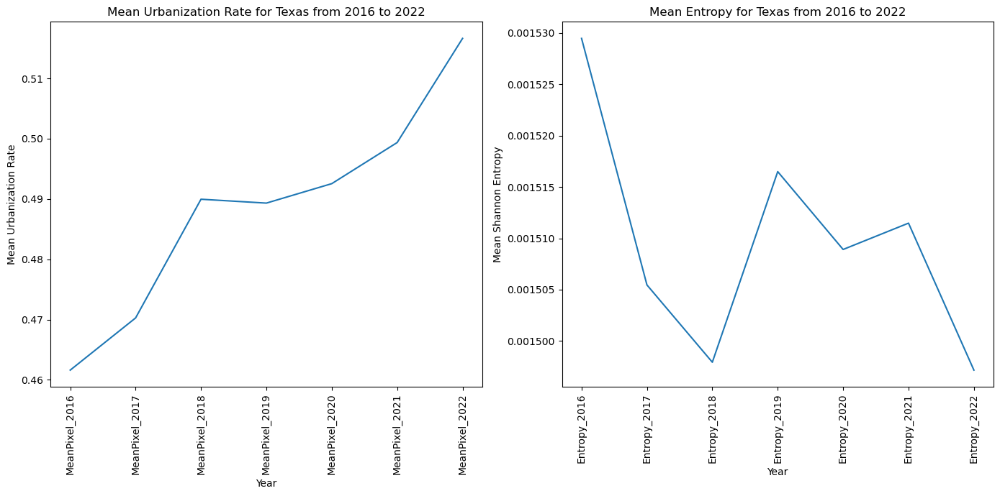

In [87]:
# plot a graph of the mean MeanPixel_2016, MeanPixel_2017, MeanPixel_2018, MeanPixel_2019, MeanPixel_2020, MeanPixel_2021
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.subplot(121)
vars = ['MeanPixel_2016', 'MeanPixel_2017', 'MeanPixel_2018', 'MeanPixel_2019', 'MeanPixel_2020', 'MeanPixel_2021', 'MeanPixel_2022']
avgs = fishnet_creator.filtered_fishnet[vars].mean(axis=0) / 255
avgs.plot(rot=90, title='Mean Urbanization Rate for Texas from 2016 to 2022')
plt.xlabel('Year')
plt.ylabel('Mean Urbanization Rate')
plt.xticks(range(len(vars)), vars)

plt.subplot(122)
vars = ['Entropy_2016', 'Entropy_2017', 'Entropy_2018', 'Entropy_2019', 'Entropy_2020', 'Entropy_2021', 'Entropy_2022']
avgs = fishnet_creator.filtered_fishnet[vars].mean(axis=0) / 255
avgs.plot(rot=90, title='Mean Entropy for Texas from 2016 to 2022')
plt.xlabel('Year')
plt.ylabel('Mean Shannon Entropy')
plt.xticks(range(len(vars)), vars)

# OPTIMIZE AXIS automatically 
plt.tight_layout()

In [88]:
# Save the new fishnet
fishnet_creator.save('../Gis/Fishnet/fishnet_quarter_mile_completed.pkl') 

# Load processed fishnet 

In [92]:
fishnet_creator = Fishnet.load('../Gis/Fishnet/fishnet_quarter_mile_completed.pkl')

In [93]:
# fishnet_creator.compute_difference('MeanPixel_2022', 'MeanPixel_2016', filtered=True, normalize = True)
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    fishnet_creator.compute_difference(f'MeanPixel_{year}', f'MeanPixel_{year-1}', filtered=True, normalize = True)

In [94]:
fishnet_creator.filtered_fishnet.head(5)

,id,geometry,batch_id,neighbors,ImageCoordinates,Width,Height,MeanPixel_2016,Entropy_2016,MeanPixel_2017,...,Entropy_2021,MeanPixel_2021-MeanPixel_2016,MeanPixel_2022,Entropy_2022,MeanPixel_2016-MeanPixel_2017,MeanPixel_2017-MeanPixel_2018,MeanPixel_2018-MeanPixel_2019,MeanPixel_2019-MeanPixel_2020,MeanPixel_2020-MeanPixel_2021,MeanPixel_2021-MeanPixel_2022
6060154,6060154.0,"POLYGON ((-95.79985 29.79208, -95.79985 29.795...",23743.0,"[6056884, 6056885, 6056886, 6060153, 6060155, ...","(403, 524, 448, 564)",45.0,40.0,181.191667,0.868003,197.341667,...,0.423354,0.203333,237.008333,0.367993,-0.063333,-0.097778,0.010556,-0.025000,-0.027778,-0.015556
6060155,6060155.0,"POLYGON ((-95.79583 29.79208, -95.79583 29.795...",23743.0,"[6056885, 6056886, 6056887, 6060154, 6060156, ...","(448, 524, 492, 564)",44.0,40.0,204.724432,0.716210,213.272727,...,0.359102,0.128977,241.815341,0.293594,-0.033523,-0.063068,0.003409,-0.009659,-0.026136,-0.016477
6060156,6060156.0,"POLYGON ((-95.79181 29.79208, -95.79181 29.795...",23743.0,"[6056886, 6056887, 6056888, 6060155, 6060157, ...","(492, 524, 537, 564)",45.0,40.0,140.250000,0.992774,133.025000,...,0.923751,0.111111,168.583333,0.923751,0.028333,-0.014444,-0.041667,-0.005556,-0.077778,0.000000
6060157,6060157.0,"POLYGON ((-95.78778 29.79208, -95.78778 29.795...",23743.0,"[6056887, 6056888, 6056889, 6060156, 6060158, ...","(537, 524, 582, 564)",45.0,40.0,114.041667,0.991948,100.583333,...,0.634310,0.392778,217.458333,0.602845,0.052778,-0.054444,-0.357778,-0.071111,0.037778,-0.012778
6060158,6060158.0,"POLYGON ((-95.78376 29.79208, -95.78376 29.795...",23743.0,"[6056888, 6056889, 6056890, 6060157, 6060159, ...","(582, 524, 627, 564)",45.0,40.0,197.200000,0.772155,198.900000,...,0.779943,-0.004444,206.550000,0.701471,-0.006667,0.013889,-0.061111,-0.004444,0.062778,-0.041111


In [96]:
map_ = fishnet_creator.plot_heatmap(feature="MeanPixel_2022-MeanPixel_2021", filtered=True, zoom=True)

In [91]:
map_

In [69]:
map_.save("../Results/heat_map.html")